In [48]:
#Jupyter magic command to improve teh display of charts in the Notebook
%matplotlib inline

```{index} single:Report writing
```
```{index} single: Simulations; Report writing
```
```{index} single: Scenarios; Report writing
```
```{index} single: Simulations; the Keep option
```

```{index} single: Scenarios; the Keep option
```

```{index} single: Keep; the Keep option to retain scenario results
```



# Report writing and scenario results

`ModelFlow`, standard pandas routines and other python libraries like `Matplotlib` and `Plotly` can be used to visualize and compare dataframes and therefore the results from scenarios -- as indeed has been done in the preceding paragraphs. 

In addition, `ModelFlow` also provides several specific routines that make such comparisons easier.

## Prepare python session

In [49]:
from modelclass import model 
import modelmf       # Add useful features to pandas dataframes 
                     # using utlities initially developed for modelflow

model.widescreen()   # These modelflow commands ensure that outputs from modelflow play well with Jupyter Notebook
model.scroll_off()

%load_ext autoreload   
%autoreload 2


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


### Load model object and simulation results from Scenario Analysis Chapter

In [50]:
mpak,_ = model.modelload(r'..\models\mpakwScenarios.pcim', run=False)


file read:  C:\mflow\Aug23\papers\mfbook\content\models\mpakwScenarios.pcim




## The Keep option

The **Keep** option facilitates the comparison of results from different scenarios run on a give model object.  In each of the simulations executed above, the `keep` option was activated. This causes the results from each simulation to be stored in the model object in a `DataFrame` that can be identified by the descriptor given to it.  


The **Keep** option facilitates the comparison of results from different scenarios run on a give model object.  In each of the simulations executed above, the `keep` option was activated. This causes the results from each simulation to be stored in the model object in a `DataFrame` that can be identified by the descriptor given to it.

By default all variables are kept, if the user wishes to restrict the kept variables to a sub-set, they can do so by setting the **keep_variables** when the simulation is run, where 

For example:

```mpak(CTempExogAllKG,2020,2040,keep='2.5% increase in C 2025-27 -- exog whole period --KG=True',keep_variables='PAKNYGDPMKTPKN PAKNE*KN PAKEM*') ```

would run a simulation between 2020 AND 2040 CALLED 2.**5% increase in C 2025-27 -- exog whole period --KG=True** but keep only the variables that matched the search string in keep_variables.

```{index} single: Simulations; Report-writing - the Keep_plot method
```
```{index} single: Scenarios; Report-writing - the Keep_plot method
```
```{index} single: Keep_solution dictionary
```



## The `.keep_plot()` method

The keep_plot method can be used to plot and compare results from the various scenarios that had been run earlier using the `keep=` option. 

By default the results across all scenarios for each selected variables will be shown on one chart at a time.


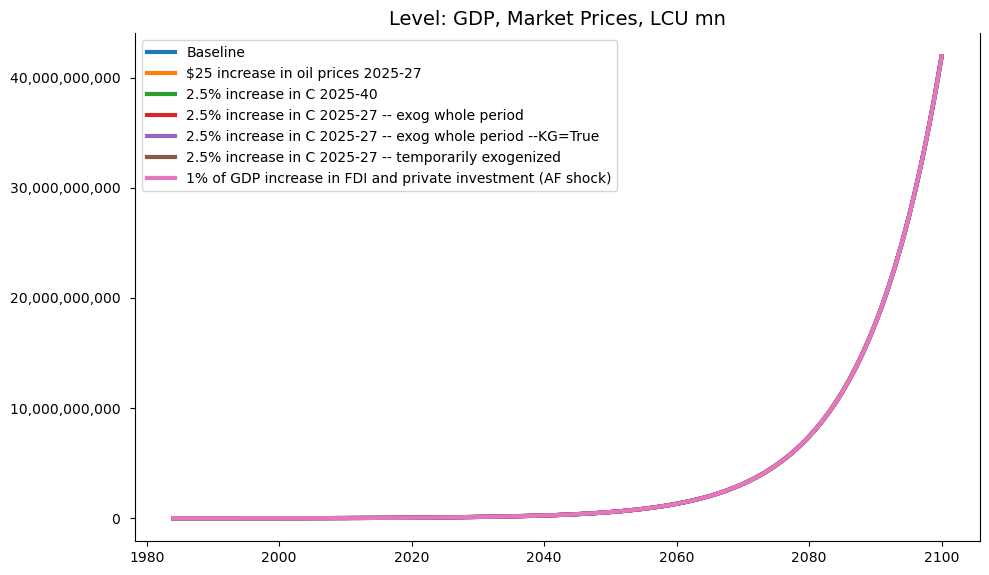

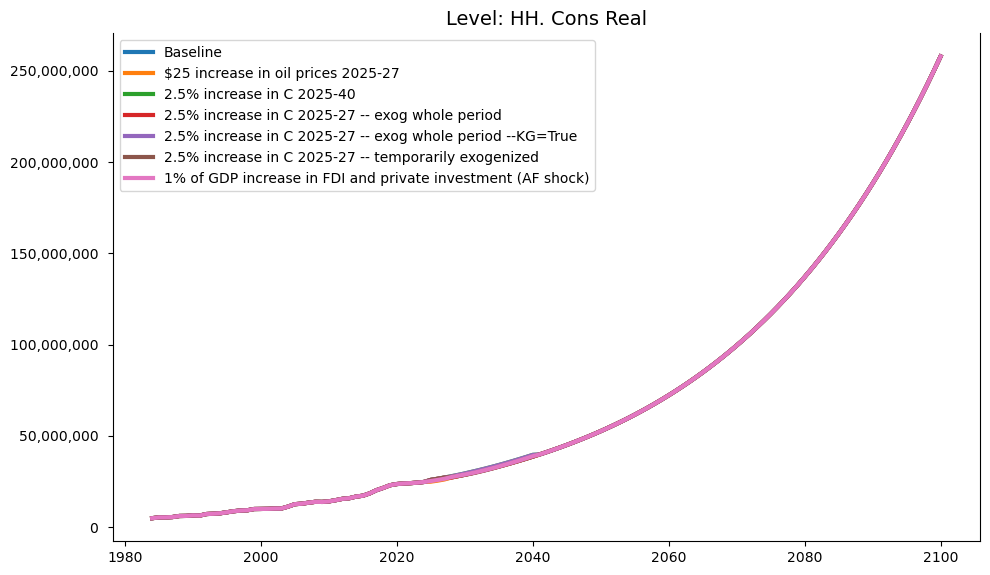

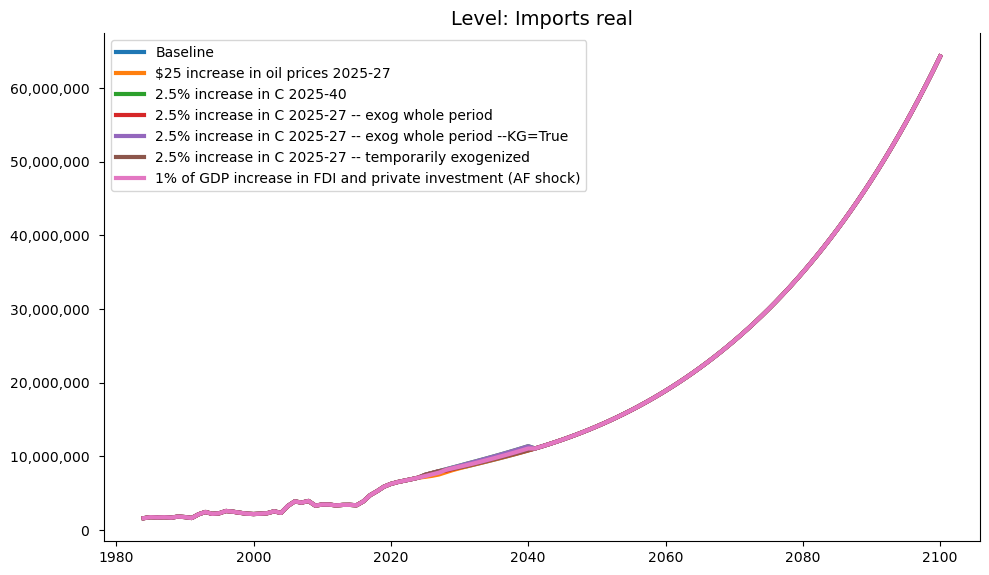

{'PAKNYGDPMKTPCN': <Figure size 1000x600 with 1 Axes>,
 'PAKNECONPRVTKN': <Figure size 1000x600 with 1 Axes>,
 'PAKNEIMPGNFSKN': <Figure size 1000x600 with 1 Axes>}

In [51]:
mpak.keep_plot('PAKNYGDPMKTPCN PAKNECONPRVTKN PAKNEIMPGNFSKN',  legend=True)
#show for each variable on a separate chart the results from each kept scenario

```{index} single: Scenarios; report-writing - keep_plot options
```
```{index} single: Simulations; report-writing - keep_plot options
```
```{index} single: Keep_plot options
```



### `keep_plot()` options

The **variables** to be displayed are listed as first argument. Variable names can include 
wildcards (using * for any string and ? for any character).

**Transformation of data displayed:** 

| showtype= |Use this operator|
| :- | :---|
 'level' (default)|No transformation  
 'growth'| The growth rate  in percent 
 'change'| The yearly change ($\Delta$) 

**legend placement**

| legend= |Use this operator|
| :- | :---|
 False (default) |The legends are  placed at the end of the corresponding line
 True|The legends are places in a legend box


Often it is useful to compare the scenario results with the baseline result. This is done with the diff argument. 

| diff= |Use this operator|
| :- | :---|
 |False (default) |All entries in the keep_solution dictionary are displayed|
 |True|The difference to the first entry is shown.|

It can also be useful to compare the scenario results with the baseline result **measured in percent**. This is done with the diffpct argument. 

| diffpct= |Use this operator|
| :- | :---|
 False (default) |All entries in the keep_solution dictionary is displayed
 True|The difference in percent to the first entry is shown
 
 
 :::{note}
`'keep_plot()` and `.keep_plot_multi()` return a python object that points to the in memory version of the rendered figure(s).  This object can be used to modify the graph (see examples towards the end of this chapter.
 
 :::
 
 ```savefig='[path/]<prefix>.<extension>'```
 Will create a number of files with the charts.<br>
 The files will be saved location with name ```<path>/<prefix><variable name>.<extension>``` <br>The extension determines the 
 format of the saved file: ```pdf```, ```svg``` and ```png``` are the most common extensions. 

```{index} single: Scenarios: Keep_plot examples - the diff option
```
```{index} single: Simulations: Keep_plot examples - the diff option
```
```{index} single: Keep_plot; examples - the diff option
```



### An example using the diff=TRUE option

When `diff=True` (or 1) results will be shown all of the selected scenarios presented as the change in selected variables with respect to the first scenario -- in this instance the scenario saved with the name `baseline`.  

:::{warning|
Note in this instance `baseline` and `basedf` are the same because they were defined that way.  However, there is nothing in the system that guarantees that the first `keep` scenario will be the baseline or the `basedf` scenario.
:::

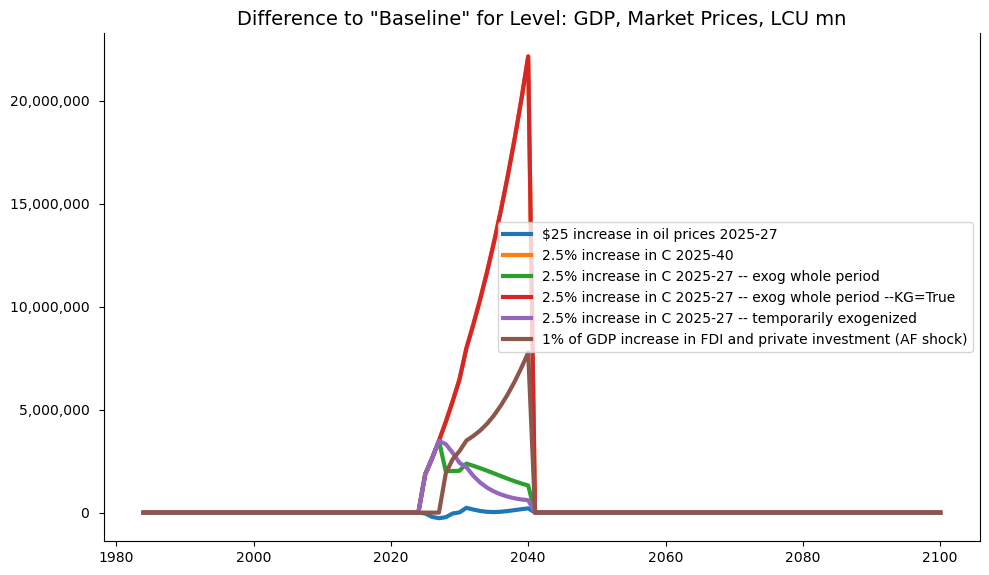

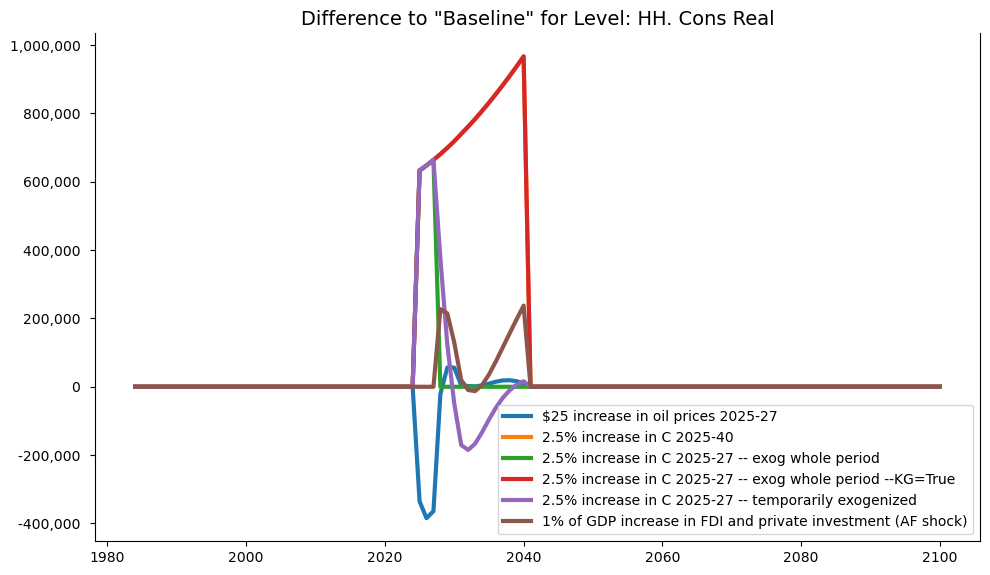

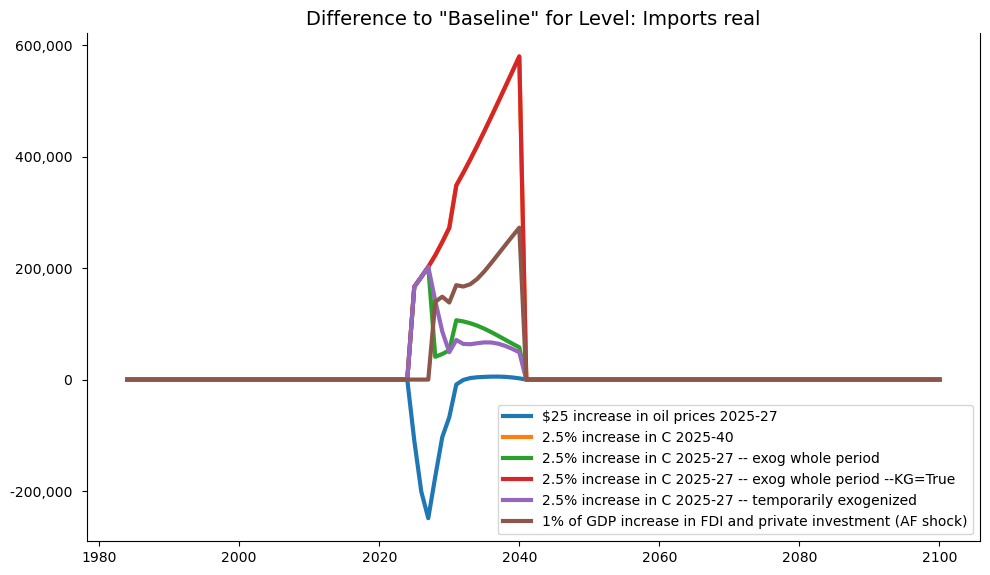

{'PAKNYGDPMKTPCN': <Figure size 1000x600 with 1 Axes>,
 'PAKNECONPRVTKN': <Figure size 1000x600 with 1 Axes>,
 'PAKNEIMPGNFSKN': <Figure size 1000x600 with 1 Axes>}

In [52]:
mpak.keep_plot('PAKNYGDPMKTPCN PAKNECONPRVTKN PAKNEIMPGNFSKN', diff=1, legend=True)


```
```{index} single: Scenarios: Keep_plot examples - showtype=growth
```
```{index} single: Simulations: Keep_plot examples - showtype=growth
```
```{index} single: Keep_plot; examples - showtype=growth
```


### The `showtype` option

In this example the difference with respect first `'keep` scenario `baseline` values are once again shown. This time the `showtype` option has been set to `growth`.  As a result the data is displayed as the  difference in the growth rate.  

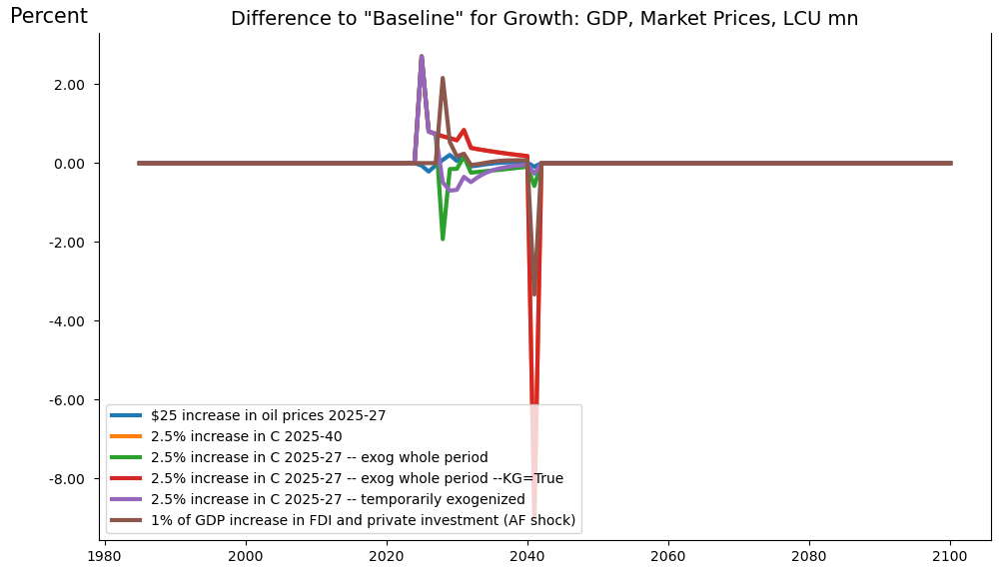

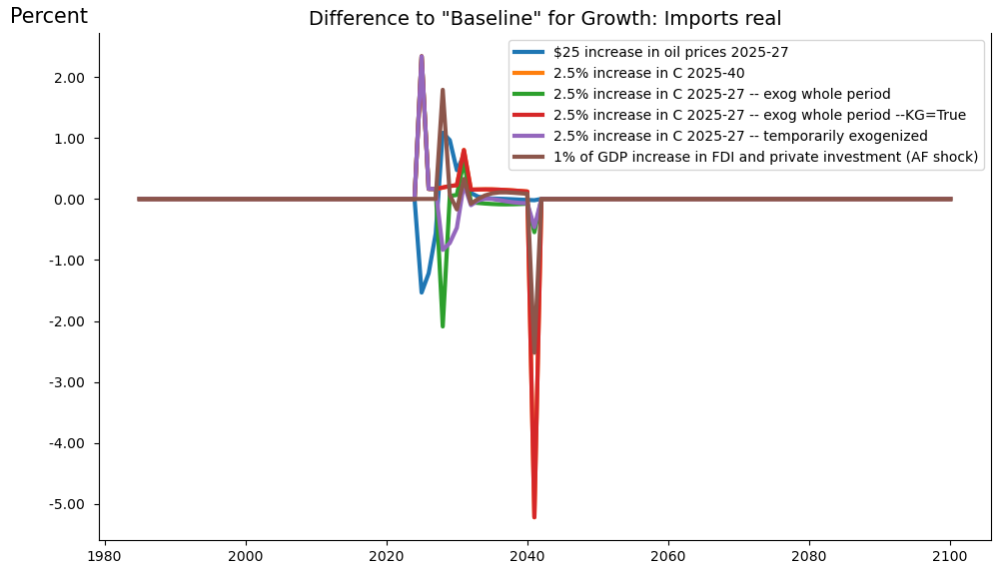

{'PAKNYGDPMKTPCN': <Figure size 1000x600 with 1 Axes>,
 'PAKNEIMPGNFSKN': <Figure size 1000x600 with 1 Axes>}

In [53]:
mpak.keep_plot('PAKNYGDPMKTPCN PAKNEIMPGNFSKN', diff=1,showtype='growth', legend=True)

```
```{index} single: Scenarios: Keep_plot examples - showtype=diffpct
```
```{index} single: Simulations: Keep_plot examples - showtype=diffpct
```
```{index} single: Keep_plot; examples - showtype=diffpct
```



### The diffpct option

Setting `diffpct=True` instructs `.keep_plot()` to display the data as a percent deviation from the first `kept` scenario, which in this case was the baseline scenario.

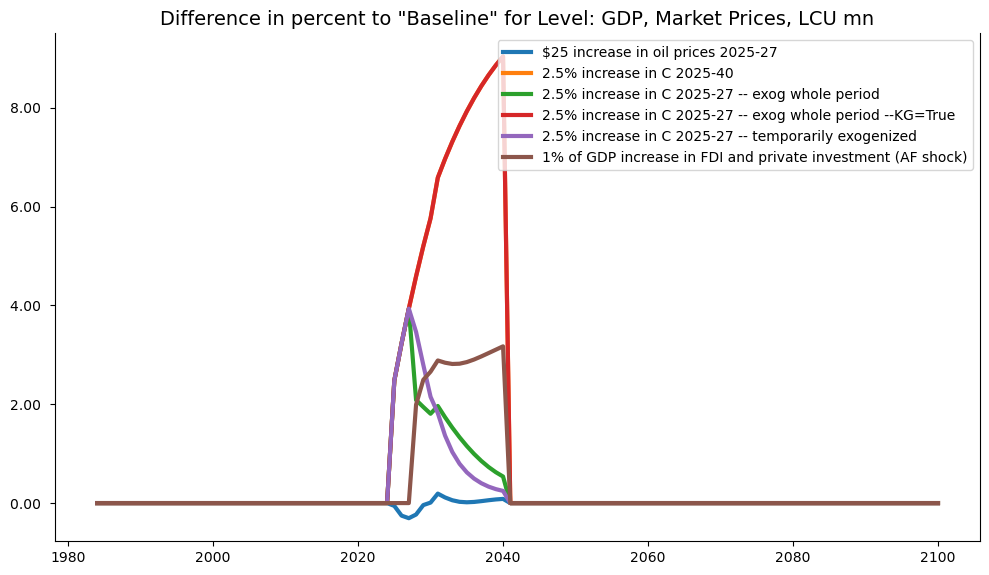

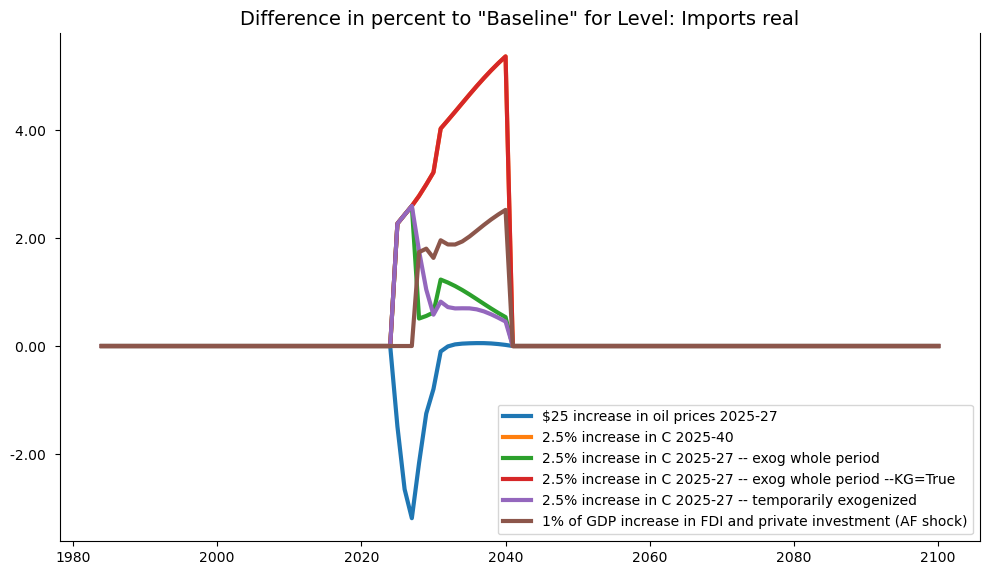

{'PAKNYGDPMKTPCN': <Figure size 1000x600 with 1 Axes>,
 'PAKNEIMPGNFSKN': <Figure size 1000x600 with 1 Axes>}

In [54]:
mpak.keep_plot('PAKNYGDPMKTPCN  PAKNEIMPGNFSKN', diffpct=1,legend="Change in level as a % of first keep scenario")


```{index} single: Simulations: Report-writing keep_plot options - Percent change from baseline:  diffpct=1,showtype='level'
```
```{index} single:Compare solutions; - keep_plot options - Percent change from baseline:  diffpct=1,showtype='level'
```

```{index} single:keep_plot options; Percent change from baseline:  diffpct=1,showtype='level'
```



#### Differences in percent of baseline values

In this plot, the same results are presented, but as percent deviations from the baseline values of the displayed data.

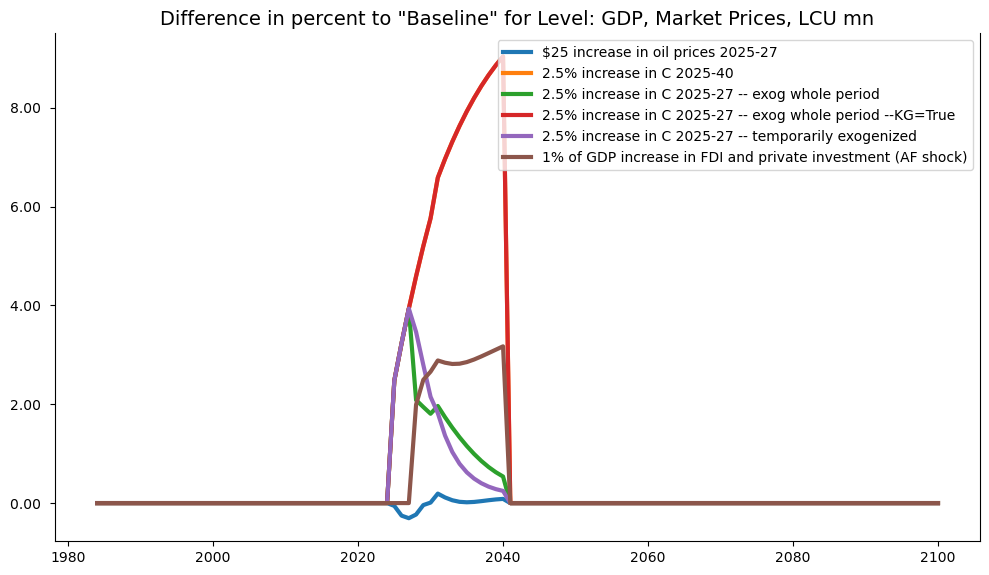

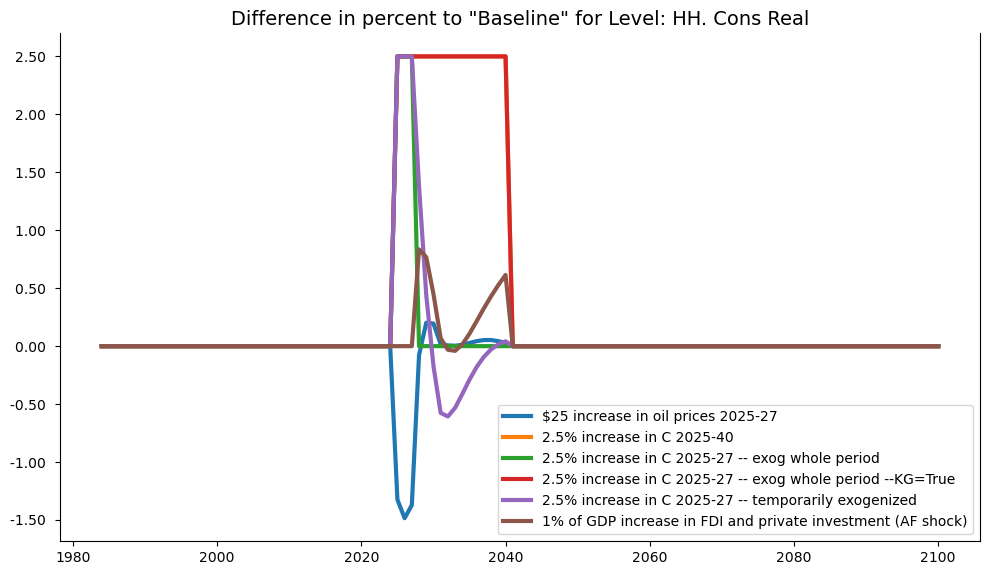

{'PAKNYGDPMKTPCN': <Figure size 1000x600 with 1 Axes>,
 'PAKNECONPRVTKN': <Figure size 1000x600 with 1 Axes>}

In [55]:
mpak.keep_plot('PAKNYGDPMKTPCN PAKNECONPRVTKN ', diffpct=1,showtype='level', legend=True)





```{index} single:keep_solutions.keys()
```

```{index} single: Simulations: keep_plot options -- keep_switch -- specify the kept scenarios to be displayed
```
```{index} single:Compare solutions; keep_plot options -- keep_switch -- specify the kept scenarios to be displayed
```

```{index} single:keep_plot options; keep_switch -- specify the kept scenarios to be displayed
```


### The `.keep_switch()` method

The `.keep_switch()` method restricts the number of scenarios on which subsequent calls to `.keep_plot()` (and `.keep_plot_multi()`) are executed on.  `.keep_switch()` can be passed a list of scenarios or using a wildcard selector.

#### The `.keep_solutions.keys()` method 
The `.keep_solutions.keys()` method generates a list of the solutions that have been kept previously.

In [56]:
mpak.keep_solutions.keys()


dict_keys(['Baseline', '$25 increase in oil prices 2025-27', '2.5% increase in C 2025-40', '2.5% increase in C 2025-27 -- exog whole period', '2.5% increase in C 2025-27 -- exog whole period --KG=True', '2.5% increase in C 2025-27 -- temporarily exogenized', '1% of GDP increase in FDI and private investment (AF shock)'])

To specify exactly which scenarios to show in a keep_plot, the `scenarios=` option of `.keepswitch()` must be initialized with a "|" delimited string of the names of the scenarios (retrieved above) that are to be displayed.

By placing the `.keepswitch()` in a `with` clause the scenario restriction will only apply to indented lines that follow the with construct.

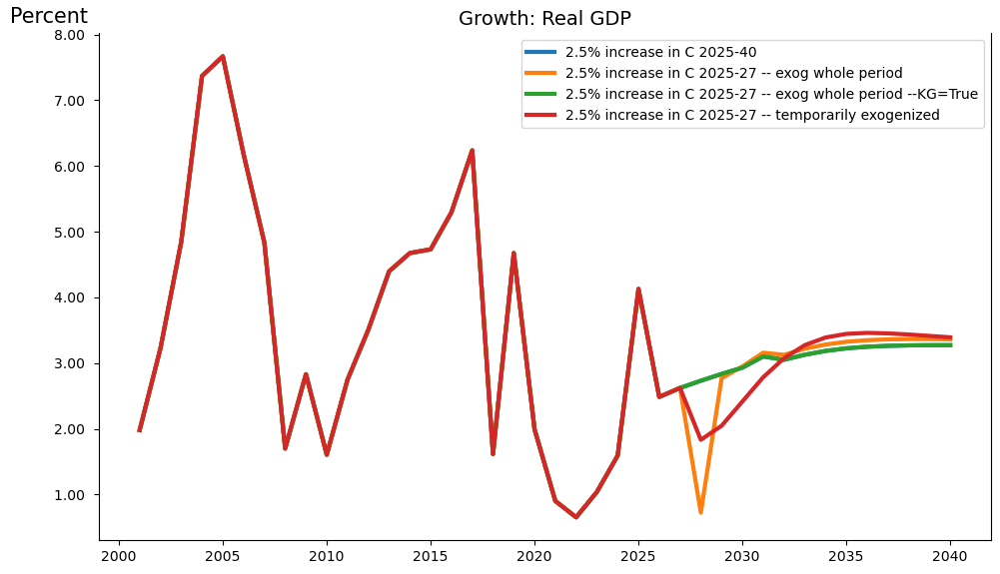

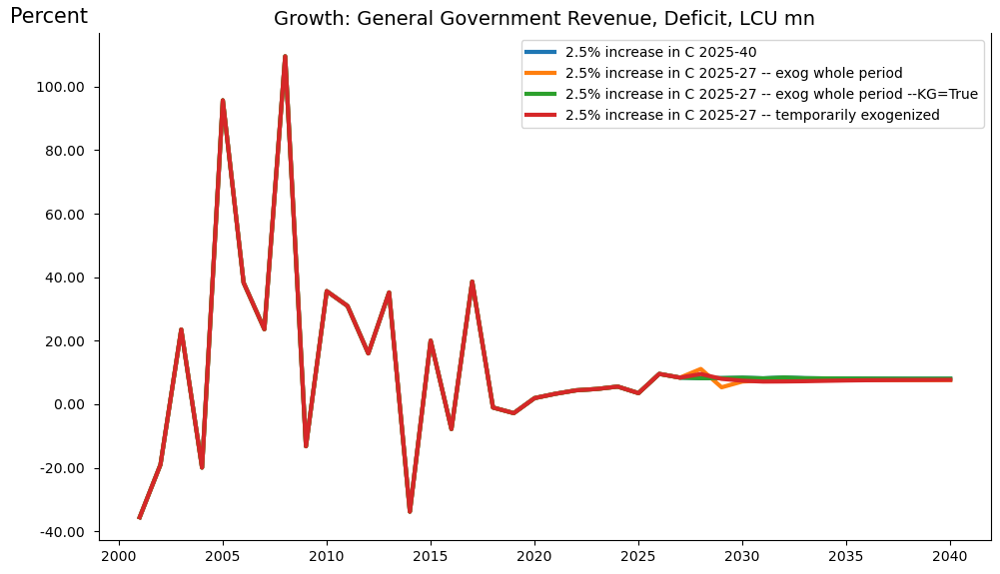

In [75]:

with mpak.keepswitch(scenarios='2.5% increase in C 2025-40|2.5% increase in C 2025-27 -- exog whole period|2.5% increase in C 2025-27 -- exog whole period --KG=True|2.5% increase in C 2025-27 -- temporarily exogenized'):
    mpak.keep_plot('PAKNYGDPMKTPKN PAKGGBALOVRLCN PAKGGDEBTTOTLCN',start=2000,end=2040,diff=False,showtype='growth',legend=True);

```{index} single: keep_switch; selection using wildcard
```
```{index} single: Simulations; Compare solutions - keep_switch with wildcard
```
```{index} single: Scenarios; Compare solutions - keep_switch with wildcard
```



#### Keepswitch with wildcard selection

Below a series of plots are generated using a wildcard selector in the keepswitch clause.

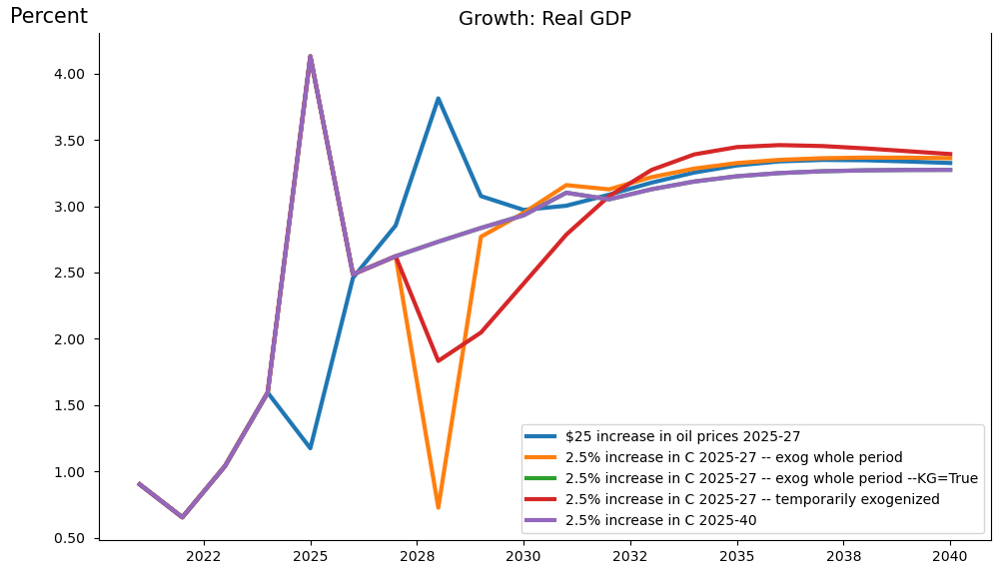

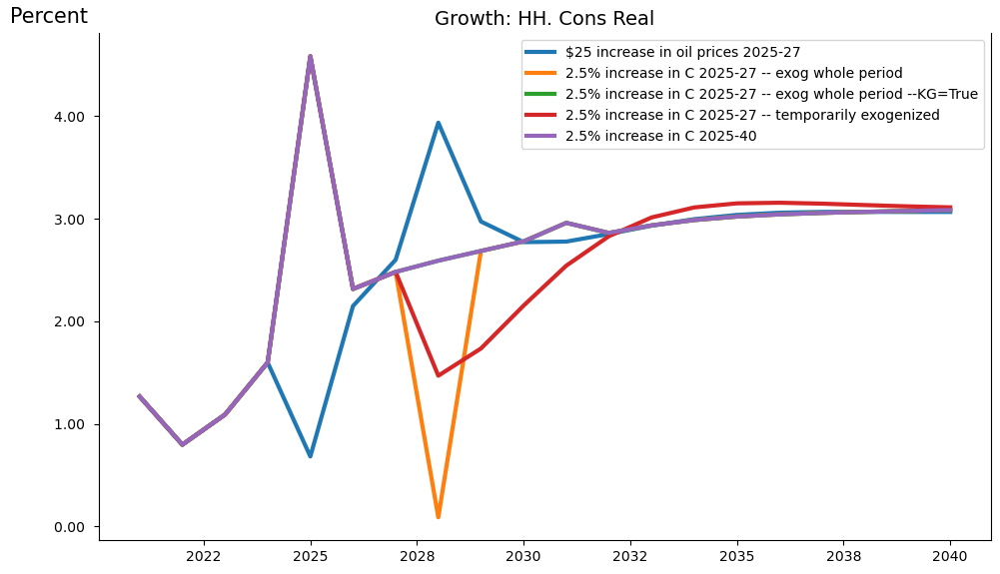

In [76]:

with mpak.keepswitch(scenarios='*2025*'):
    mpak.keep_plot('PAKNYGDPMKTPKN PAKNECONPRVTKN',showtype='growth',legend=True,start=2020,end=2040);

```{index} single: Simulations; Report-writing keep_plot_multi - comparison of scenario results impacts on multiple series
```
```{index} single: Simulations; Compare solutions - comparison of scenario results impacts on multiple series
```
```{index} single: Scenarios; Report-writing keep_plot_multi - comparison of scenario results impacts on multiple series
```
```{index} single: Scenarios; Compare solutions - comparison of scenario results impacts on multiple series
```
```{index} single: Report-writing; .keep_plot_multi - comparison of scenario results impacts on multiple series
```
```{index} single:keep_plot_multi; - comparison of scenario results impacts on multiple series
```



## The `.keep_plot_multi()` method

The `.keep_plot_multi()` method allows several charts to be displayed in a grid.  The size of each chart can be set with the `size=(w,h)` option, where the units of with and height are in centimetres.


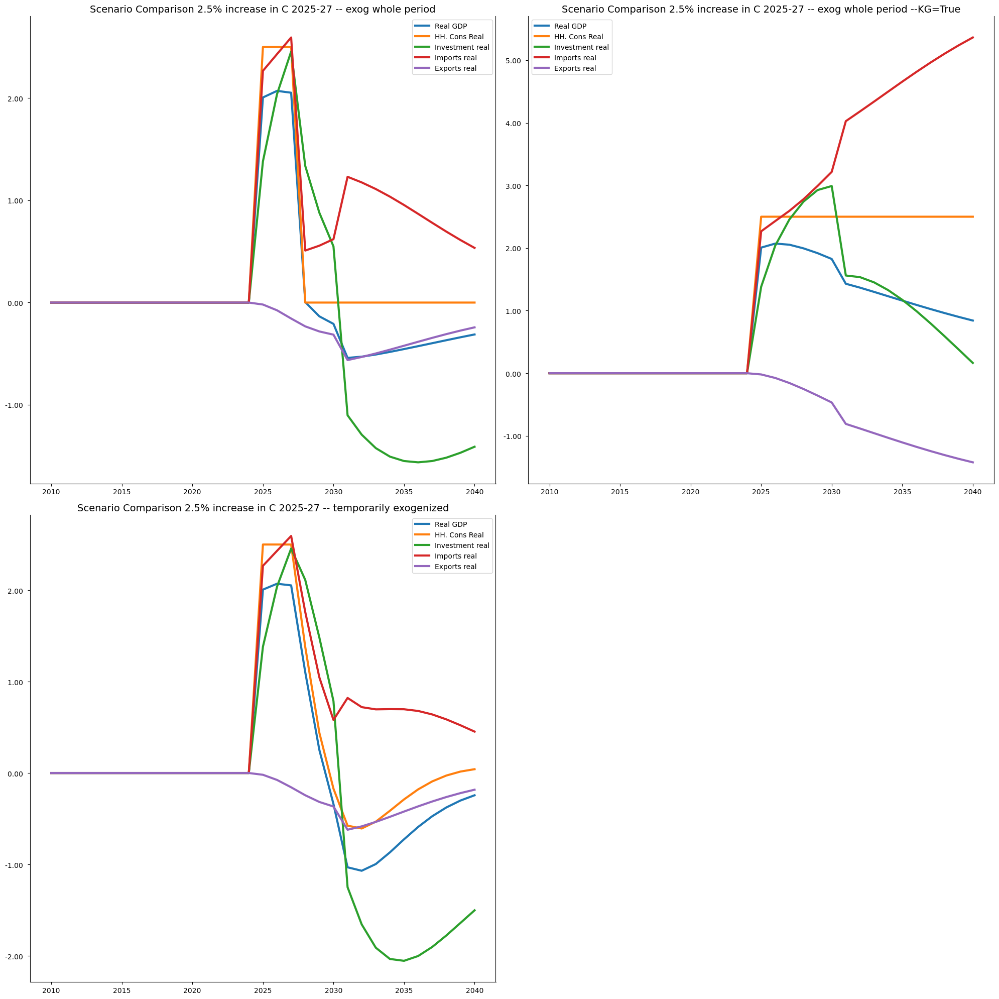

In [67]:
with mpak.set_smpl(2000,2040):
    with mpak.keepswitch(scenarios="baseline *exog*"):
        var_figs = mpak.keep_plot_multi('PAKNYGDPMKTPKN PAKNECONPRVTKN PAKNEGDIFTOTKN PAKNEIMPGNFSKN PAKNEEXPGNFSKN',2010,2040,keep_dim=0,legend=1
                                ,size=(20,20) ,diffpct=True,title='Scenario Comparison'  );

As indicated earlier both `keep_plot()` and `keep_plot_multi()` return a variable that can be used to embellish or modify the figures produced by the automatic routines.

For example the charts can be resized.

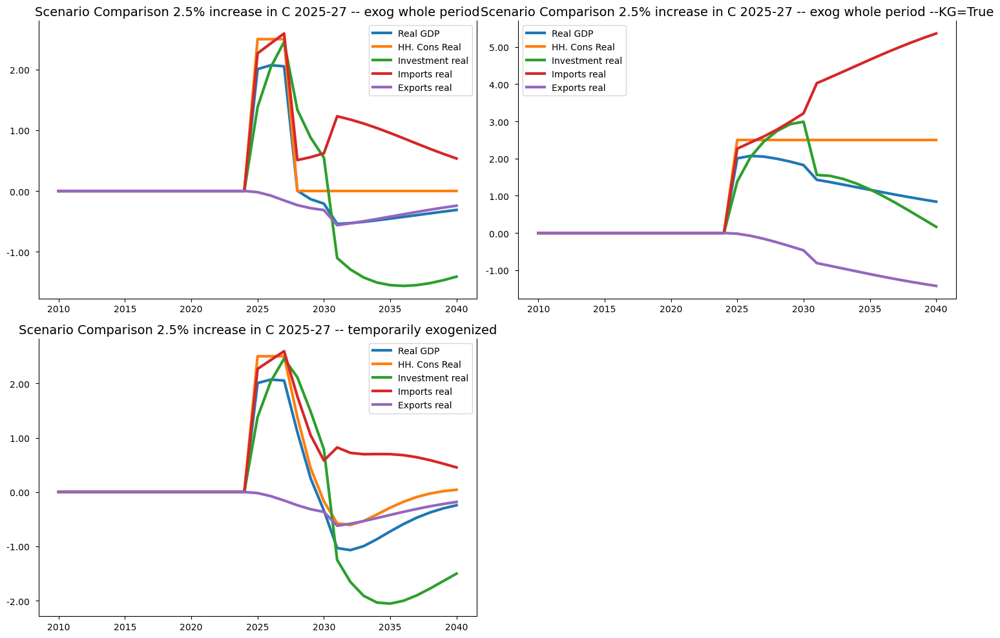

In [68]:
var_figs.set_size_inches(15,10)
var_figs

Individual charts can be deleted from the grid.  

:::{note}
The grid representation of the individual charts is returned as a 0-based vector of charts.  Thus the first figure is the zeroeth and the second is the first.
:::

```{index} single: Mathplotlib; plots - Delete figure from grid of charts 
```
```{index} single: Report-writing; Delete figure from grid of charts (mathplotlib functionality)
```



### Delete a chart from the grid

A chart can be deleted from the grid by referencing it and calling the `.remove()` method. 

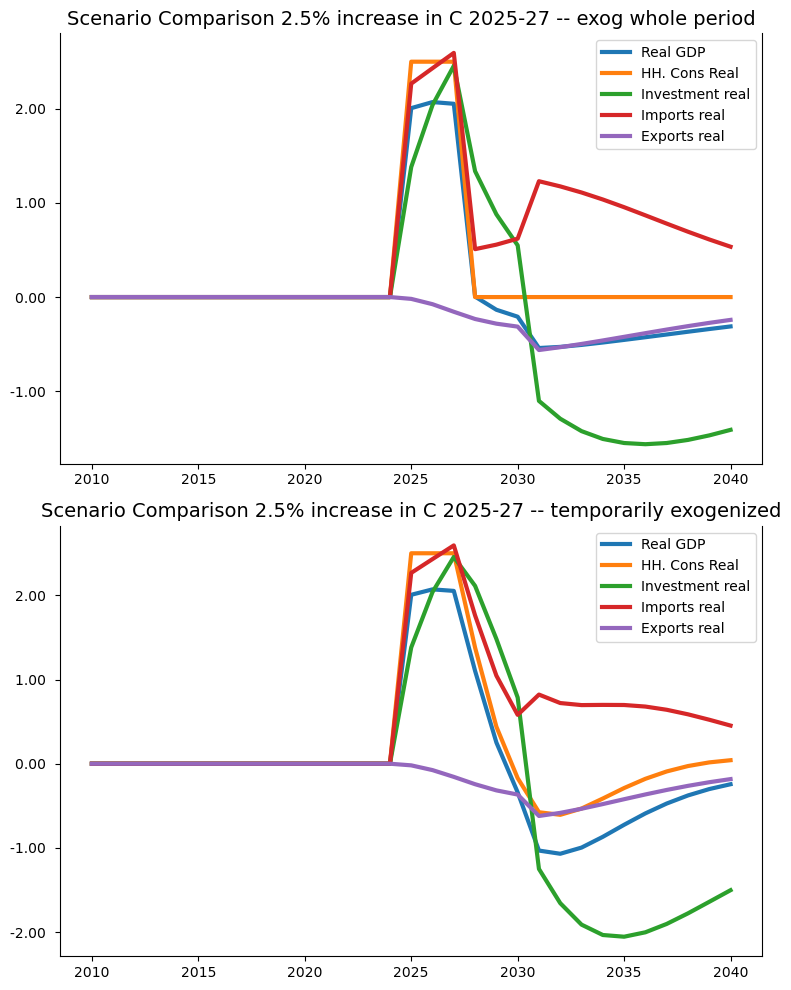

In [69]:
var_figs.axes[1].remove()
var_figs

The same mechanism can be used to revise the titles of the indidividual charts and annotate them.

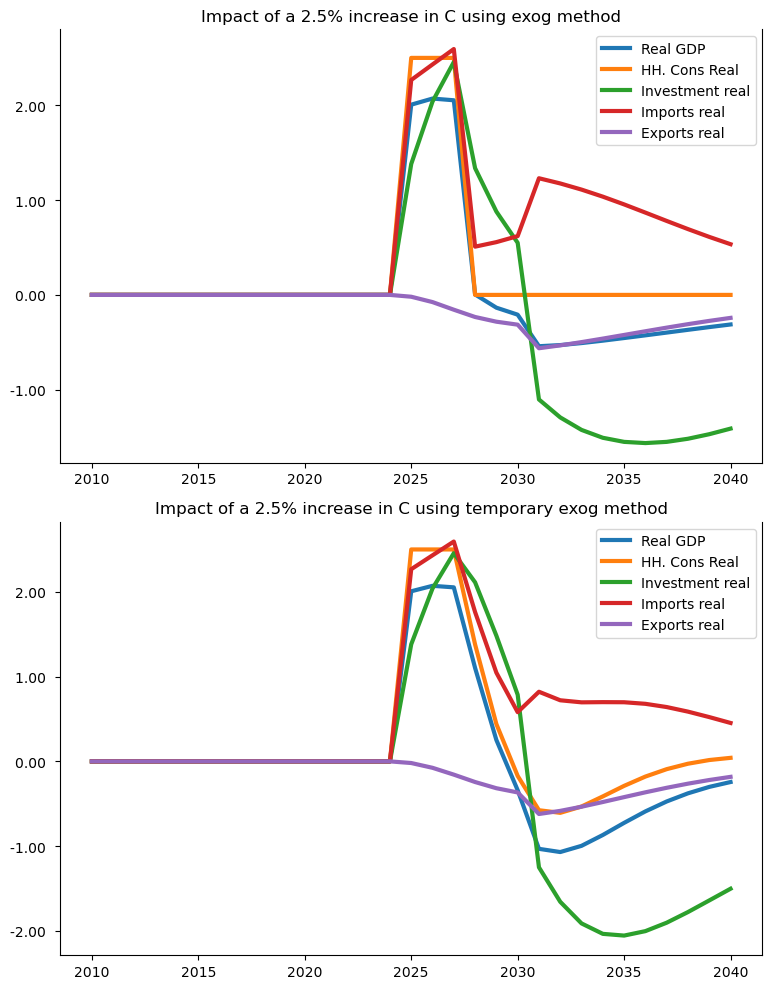

In [70]:
var_figs.axes[0].set_title('Impact of a 2.5% increase in C using exog method');    # many properties can be set afterward 
var_figs.axes[1].set_title('Impact of a 2.5% increase in C using temporary exog method');
var_figs

```{index} single; Mathplotlib; revise charts after built
```




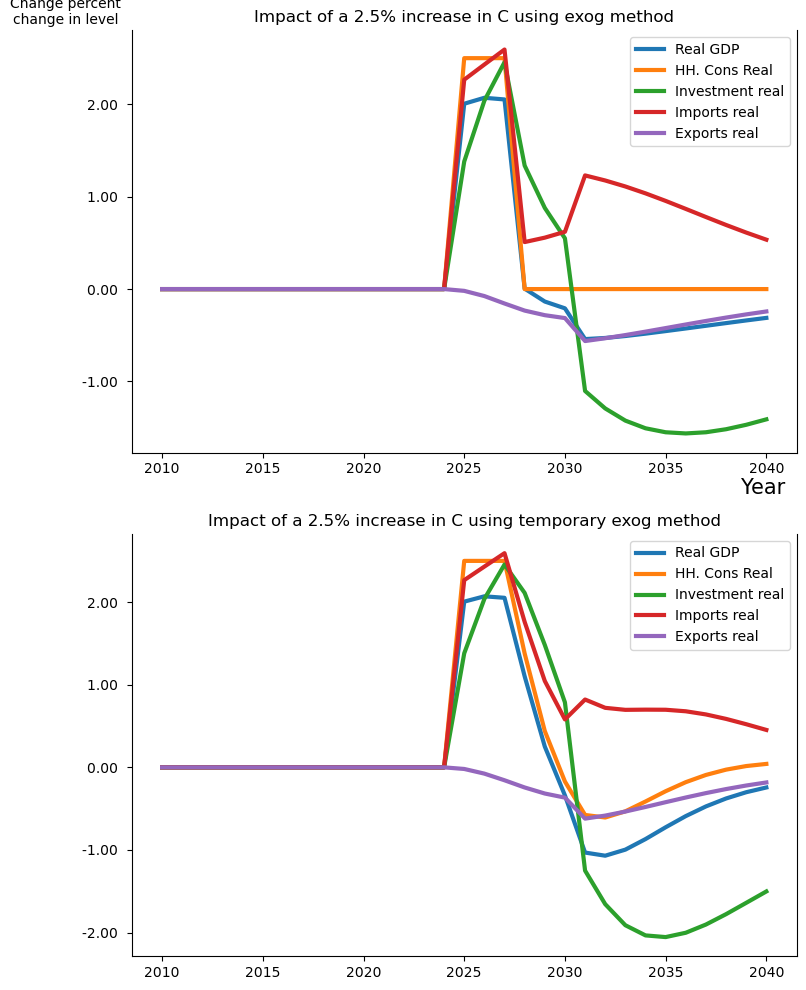

In [71]:
var_figs.axes[0].set_xlabel('Year')
var_figs.axes[0].set_ylabel('Change percent\nchange in level',fontsize=10)
var_figs.axes[0].yaxis.set_label_coords(-0.1,1.02)
var_figs.axes[0].xaxis.set_label_coords(.95,-.06)
var_figs

Variables pointing to the individual charts can be defined and used to make modifications to individual charts within the overall figure.



In [64]:
fig1=var_figs.axes[0]
fig2=var_figs.axes[1]


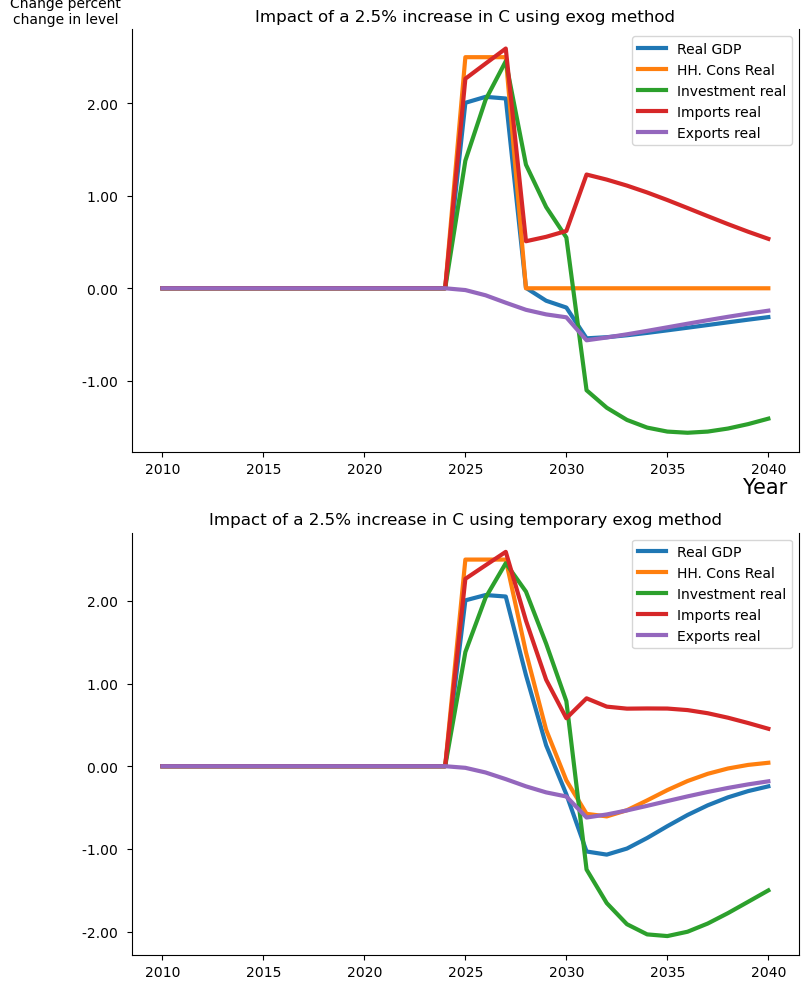

In [72]:
fig2.set_ylabel('Percent change\nin level',fontsize=10)
fig2.yaxis.set_label_coords(-0.1,1.02) #place axes labels
fig2.xaxis.set_label_coords(.95,-.06)



fig2.text(2040.,0.4, 'Some text in a box', 
          color='yellow',bbox=dict(facecolor='red', alpha=0.5));
fig2.text(2040.,0.1, 'Some nice text', 
          style='italic',color='green');
          
var_figs
          

```{index} single: Scenarios; Compare solutions: Results widget 
```
```{index} single: Simulations; Compare solutions: Results widget 
```
```{index} single: Report writing; interactively compare results across kept solutions
```

